## name: 孙凸
## Student number: 16336360
## e-mail: suntu@shanghaitech.edu.cn
## SPST
## Homework3 Single particle analysis 

In [1]:
"""读取good.star和bad.star文件路径"""

import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = (30.0, 30.0) # set default size of plots

path_starfile = '/home/cs286/HW/HW3'
good = path_starfile + '/good.star'
bad = path_starfile + '/bad.star'
print(good)
print(bad)

/home/cs286/HW/HW3/good.star
/home/cs286/HW/HW3/bad.star


In [2]:
"""创建用于读取star文件的函数，形参为文件路径，返回文件名和对应的x,y坐标"""

def read_star_file(file_path):
    file_name = []
    file_name_new = []
    file_coordinate_X = []
    file_coordinate_Y = []
    with open(file_path) as f:
        line = f.readline()
        while line:
            # print(line)
            line = line.split(' ')
            if len(line) == 16:
                # print(line[0], line[1], line[2])
                file_name.append(line[0])
                file_coordinate_X.append(line[1])
                file_coordinate_Y.append(line[2])
            line =f.readline()
    # print(len(file_name), len(file_coordinate_X), len(file_coordinate_Y))
    
    for i in range(len(file_name)): # 这里文件名多了其它路径，需要额外处理掉
        file_name_temp = file_name[i].split('/')
        file_name_new.append(file_name_temp[2])
    
    return file_name_new, file_coordinate_X, file_coordinate_Y

good_filename, good_x, good_y = read_star_file(good)
bad_filename, bad_x, bad_y = read_star_file(bad)
print(len(good_filename), len(good_x), len(good_y)) # 查看label对应的总数目
print(len(bad_filename), len(bad_x), len(bad_y))
# print(good_filename)

9261 9261 9261
5100 5100 5100


In [3]:
"""读取的文件名实际上就对应图像名称，这些filename都来自于20个图像文件，这里获取这些名称的集合"""

good_filename_set = set(good_filename)
print(len(good_filename_set)) # 查看集合中元素的总数，即20个图像
# print(good_filename_set)

20


In [4]:
bad_filename_set = set(bad_filename) # 同上
print(len(bad_filename_set))
# print(good_filename_set)

20


In [5]:
def print_list(list_file): # 创建函数，用于打印文件名
    for i in list_file:
        print(i)

In [6]:
good_filename_set = list(good_filename_set) # 将set转换为list方便进一步操作
bad_filename_set = list(bad_filename_set)

In [7]:
print_list(good_filename_set) # 查看x, y坐标对应的所有文件名

14sep05c_c_00003gr_00014sq_00007hl_00005es.frames_rigid_aligned.mrc
14sep05c_c_00003gr_00014sq_00011hl_00002es.frames_rigid_aligned.mrc
14sep05c_c_00003gr_00014sq_00006hl_00005es.frames_rigid_aligned.mrc
14sep05c_00024sq_00006hl_00003es.frames_rigid_aligned.mrc
14sep05c_c_00003gr_00014sq_00005hl_00002es.frames_rigid_aligned.mrc
14sep05c_c_00003gr_00014sq_00006hl_00002es.frames_rigid_aligned.mrc
14sep05c_c_00003gr_00014sq_00005hl_00005es.frames_rigid_aligned.mrc
14sep05c_c_00003gr_00014sq_00009hl_00004es.frames_rigid_aligned.mrc
14sep05c_c_00003gr_00014sq_00011hl_00003es.frames_rigid_aligned.mrc
14sep05c_c_00003gr_00014sq_00007hl_00004es.frames_rigid_aligned.mrc
14sep05c_c_00003gr_00014sq_00010hl_00002es.frames_rigid_aligned.mrc
14sep05c_00024sq_00003hl_00002es.frames_rigid_aligned.mrc
14sep05c_c_00003gr_00014sq_00011hl_00004es.frames_rigid_aligned.mrc
14sep05c_c_00003gr_00014sq_00008hl_00005es.frames_rigid_aligned.mrc
14sep05c_c_00003gr_00014sq_00005hl_00003es.frames_rigid_aligned.mrc


In [8]:
print_list(bad_filename_set) # 同上

14sep05c_00024sq_00006hl_00003es.frames_rigid_aligned.mrc
14sep05c_c_00003gr_00014sq_00007hl_00005es.frames_rigid_aligned.mrc
14sep05c_c_00003gr_00014sq_00006hl_00005es.frames_rigid_aligned.mrc
14sep05c_c_00003gr_00014sq_00011hl_00002es.frames_rigid_aligned.mrc
14sep05c_c_00003gr_00014sq_00005hl_00002es.frames_rigid_aligned.mrc
14sep05c_c_00003gr_00014sq_00006hl_00002es.frames_rigid_aligned.mrc
14sep05c_c_00003gr_00014sq_00005hl_00005es.frames_rigid_aligned.mrc
14sep05c_c_00003gr_00014sq_00009hl_00004es.frames_rigid_aligned.mrc
14sep05c_c_00003gr_00014sq_00011hl_00003es.frames_rigid_aligned.mrc
14sep05c_c_00003gr_00014sq_00007hl_00004es.frames_rigid_aligned.mrc
14sep05c_c_00003gr_00014sq_00010hl_00002es.frames_rigid_aligned.mrc
14sep05c_00024sq_00003hl_00002es.frames_rigid_aligned.mrc
14sep05c_c_00003gr_00014sq_00011hl_00004es.frames_rigid_aligned.mrc
14sep05c_c_00003gr_00014sq_00008hl_00005es.frames_rigid_aligned.mrc
14sep05c_c_00003gr_00014sq_00005hl_00003es.frames_rigid_aligned.mrc


In [9]:
path_image = '/home/cs286/HW/HW3/micrograph' # 读入图像文件路径

/home/cs286/HW/HW3/micrograph/14sep05c_c_00003gr_00014sq_00007hl_00005es.frames_rigid_aligned.mrc


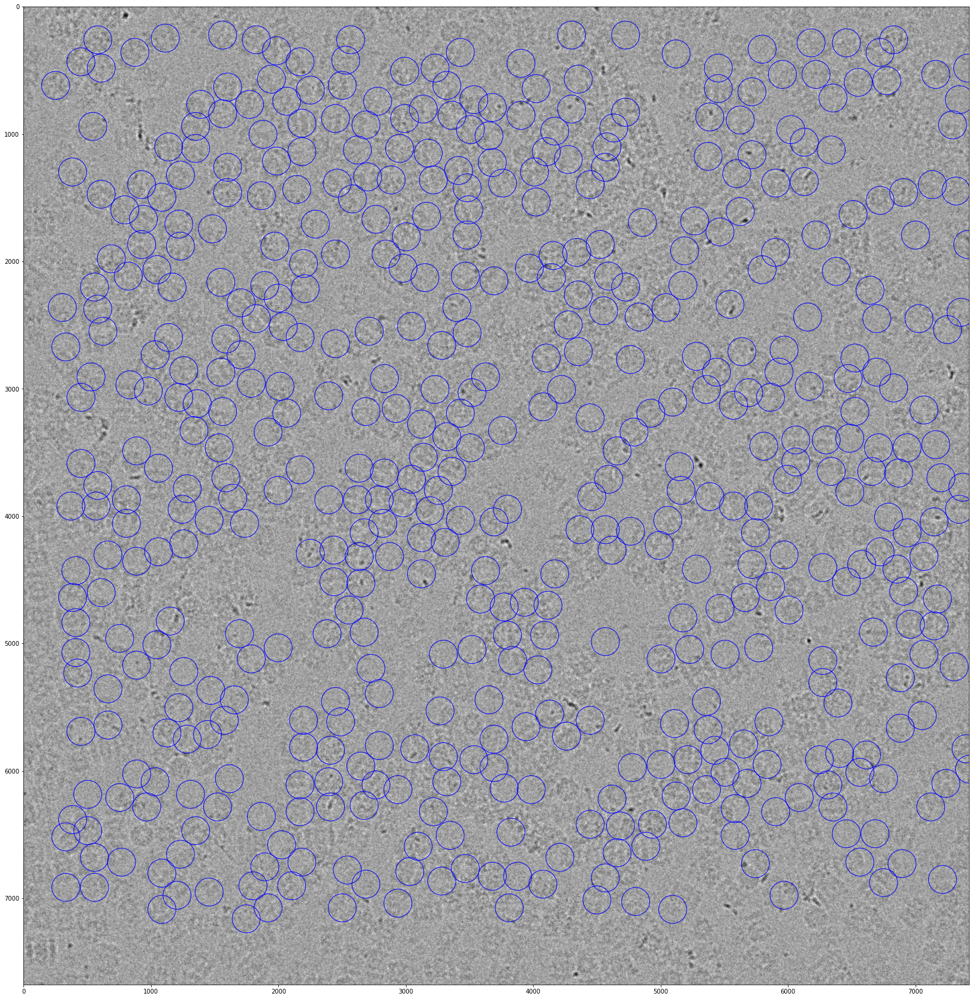

In [10]:
"""在最初处理图像的时候自己尝试编写了低通滤波器，但是发现效果不好，这里直接调用了scipy中的高斯滤波器，效果不错。这里的代码主要
用于查看good.star文件中给出的x,y坐标在对应的图像中的标记情况。在尝试了各种图像旋转，翻转以及转置之后，目前的效果是最好的，不过依然有些奇怪，
圈的位置整体有些偏右。

"""



import mrcfile as mf
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from scipy.ndimage import filters
from matplotlib.patches import Circle 
import numpy as np

%matplotlib inline
plt.rcParams['figure.figsize'] = (30.0, 30.0) # set default size of plots

def draw_circle(filename_set, filename, coor_x, coor_y, path_image, num): # 创建用于标记可视化的函数

    mrc_file_path = path_image + '/' + filename_set[num]
    print(mrc_file_path)
    with mf.open(mrc_file_path) as mrc: # 使用mrcfile读取mrc图像
        image = mrc.data   
    image = filters.gaussian_filter(image,3) # 使用高斯低通滤波器
    # 这里尝试过各种图像旋转，翻转，转置等处理
    # image = np.rot90(image, -1)
    # image = np.transpose(image)
    # image = np.flipud(image)
    # image = np.fliplr(image)    
    plt.imshow(image, cmap = 'gray')    
    current_Axis = plt.gca()
    for i in range(len(coor_x)):
        if filename[i] == filename_set[num]:            
            #rect = patches.Rectangle((int(coor_x[i])-110, int(coor_y[i])-110), 220, 220, linewidth=1, edgecolor='r', facecolor='None')
            cir = Circle((int(coor_x[i]),int(coor_y[i])),  110, color = 'b', linewidth=1, alpha = 1, fill = False)
            current_Axis.add_patch(cir) 
    plt.show()

draw_circle(good_filename_set, good_filename, good_x, good_y, path_image, 0) # 可视化第一张图像，图像名打印在下方，x,y坐标来自于good.star文件

/home/cs286/HW/HW3/micrograph/14sep05c_00024sq_00006hl_00003es.frames_rigid_aligned.mrc


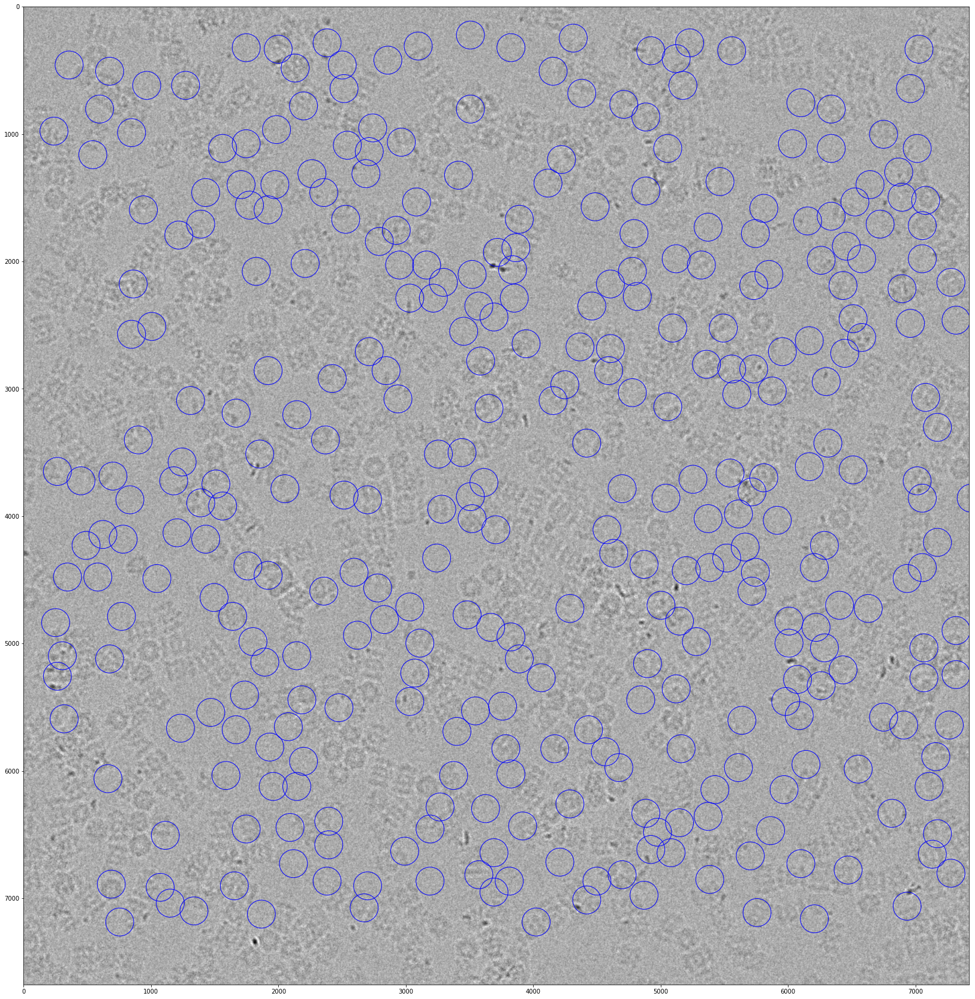

In [11]:
draw_circle(bad_filename_set, bad_filename, bad_x, bad_y, path_image, 0) # 同理，第一张图像，x, y坐标来自于bad.star文件

/home/cs286/HW/HW3/micrograph/14sep05c_c_00003gr_00014sq_00007hl_00005es.frames_rigid_aligned.mrc


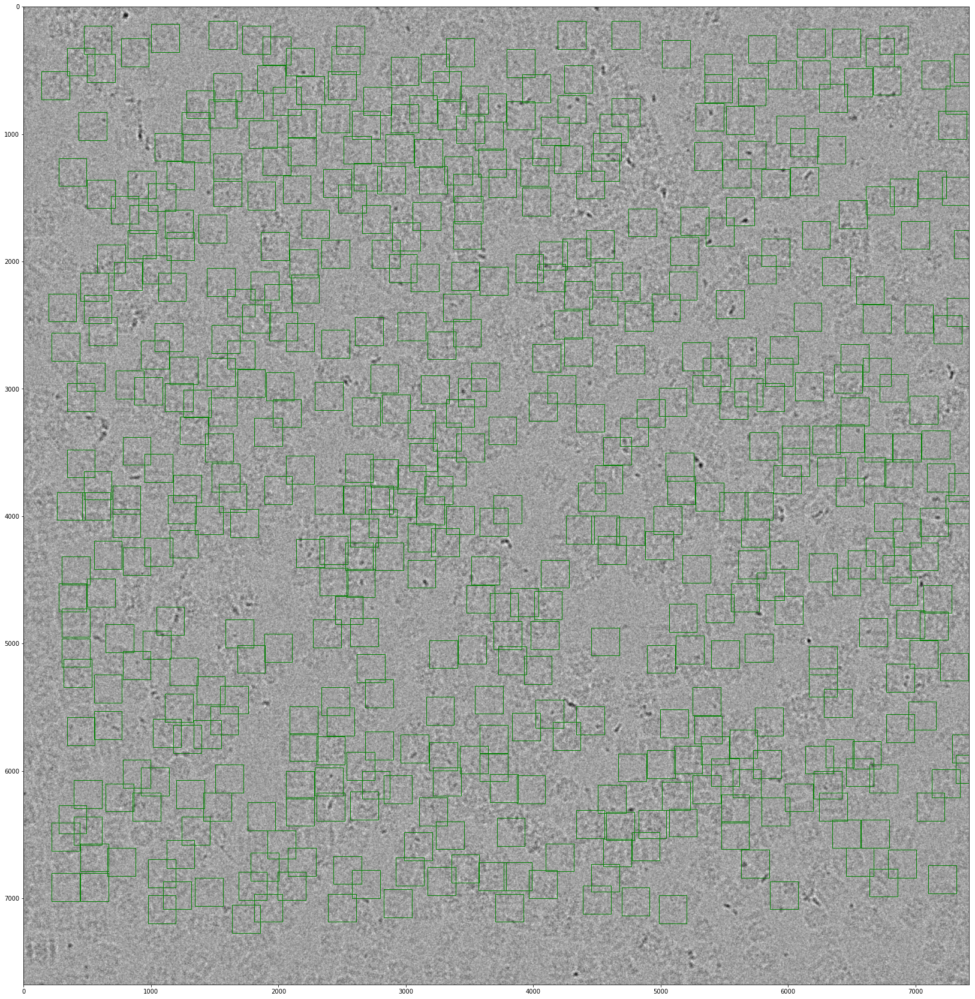

In [12]:
"""在实际取得训练和测试数据的时候需要需要获取矩形图像，方便操作，这里主要目的是确认选框位置，和上面的可视化只是把圈改成了正方形"""


def draw_rectangle(filename_set, filename, coor_x, coor_y, path_image, num):

    mrc_file_path = path_image + '/' + filename_set[num]
    print(mrc_file_path)
    with mf.open(mrc_file_path) as mrc:
        image = mrc.data   
    image = filters.gaussian_filter(image,3)
    plt.imshow(image, cmap = 'gray')    
    current_Axis = plt.gca()
    for i in range(len(coor_x)):
        if filename[i] == filename_set[num]:            
            rect = patches.Rectangle((int(coor_x[i])-110, int(coor_y[i])-110), 220, 220, linewidth=1, edgecolor='g', facecolor='None')
            # cir = Circle((int(good_x[i]),int(good_y[i])),  110, color = 'b', linewidth=1, alpha = 1, fill = False)
            current_Axis.add_patch(rect) 
    plt.show()

draw_rectangle(good_filename_set, good_filename, good_x, good_y, path_image, 0)

/home/cs286/HW/HW3/micrograph/14sep05c_00024sq_00006hl_00003es.frames_rigid_aligned.mrc


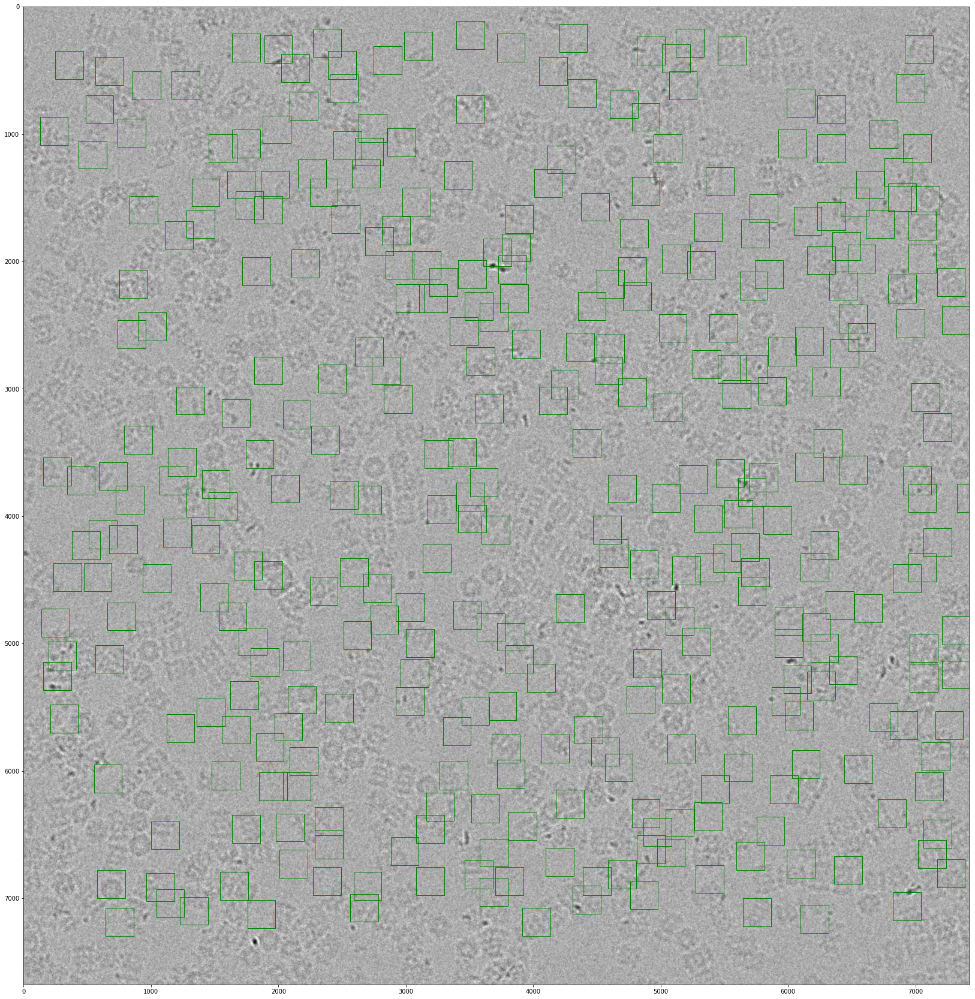

In [13]:
draw_rectangle(bad_filename_set, bad_filename, bad_x, bad_y, path_image, 0) # 同理，bad.star

In [14]:
"""创建函数用于获取x,y坐标给定位置区域的矩阵信息，由于前面发现有些选框超出了图像又边界，这里需要将这些去掉。最终的返回值为一个列表，里面的
元素为坐标对于区域内的图像信息"""


def extract_rectangle(filename_set, filename, coor_x, coor_y, path_image, image_list):
    for i in range(len(filename_set)): # 通过循环逐个文件读取所有位置信息
        mrc_file_path = path_image + '/' + filename_set[i]
        print(mrc_file_path)
        with mf.open(mrc_file_path) as mrc: # 读取mrc文件
            image = mrc.data   
        image = filters.gaussian_filter(image,3)  # 高斯低通滤波
        for j in range(len(coor_x)):
            if filename[j] == filename_set[i]:  # 除去超出又边框的位置信息
                if (int(coor_x[j])-114)< 0 or (int(coor_y[j])-114)<0 or (int(coor_x[j])+114)>len(image[0,:])or (int(coor_y[j])+114)>len(image[:,0]):
                    pass
                else:  # 通过切片的方式读取区域内矩阵信息，这里图像大小设置成了(227, 227)，方便后面构建CNN模型
                    image_temp = image[int(coor_y[j])-113:int(coor_y[j])+114,int(coor_x[j])-113:int(coor_x[j])+114]
                    image_list.append(image_temp) # 将所有小矩阵添加到list中
                    
    return image_list
                    
good_data = []
good_data = extract_rectangle(good_filename_set, good_filename, good_x, good_y, path_image, good_data) # 获得所有good.star文件对应的图像信息

/home/cs286/HW/HW3/micrograph/14sep05c_c_00003gr_00014sq_00007hl_00005es.frames_rigid_aligned.mrc
/home/cs286/HW/HW3/micrograph/14sep05c_c_00003gr_00014sq_00011hl_00002es.frames_rigid_aligned.mrc
/home/cs286/HW/HW3/micrograph/14sep05c_c_00003gr_00014sq_00006hl_00005es.frames_rigid_aligned.mrc
/home/cs286/HW/HW3/micrograph/14sep05c_00024sq_00006hl_00003es.frames_rigid_aligned.mrc
/home/cs286/HW/HW3/micrograph/14sep05c_c_00003gr_00014sq_00005hl_00002es.frames_rigid_aligned.mrc
/home/cs286/HW/HW3/micrograph/14sep05c_c_00003gr_00014sq_00006hl_00002es.frames_rigid_aligned.mrc
/home/cs286/HW/HW3/micrograph/14sep05c_c_00003gr_00014sq_00005hl_00005es.frames_rigid_aligned.mrc
/home/cs286/HW/HW3/micrograph/14sep05c_c_00003gr_00014sq_00009hl_00004es.frames_rigid_aligned.mrc
/home/cs286/HW/HW3/micrograph/14sep05c_c_00003gr_00014sq_00011hl_00003es.frames_rigid_aligned.mrc
/home/cs286/HW/HW3/micrograph/14sep05c_c_00003gr_00014sq_00007hl_00004es.frames_rigid_aligned.mrc
/home/cs286/HW/HW3/micrograph/

In [15]:
bad_data = []
bad_data = extract_rectangle(bad_filename_set, bad_filename, bad_x, bad_y, path_image, bad_data) # 同理，bad.star文件中的图像信息

/home/cs286/HW/HW3/micrograph/14sep05c_00024sq_00006hl_00003es.frames_rigid_aligned.mrc
/home/cs286/HW/HW3/micrograph/14sep05c_c_00003gr_00014sq_00007hl_00005es.frames_rigid_aligned.mrc
/home/cs286/HW/HW3/micrograph/14sep05c_c_00003gr_00014sq_00006hl_00005es.frames_rigid_aligned.mrc
/home/cs286/HW/HW3/micrograph/14sep05c_c_00003gr_00014sq_00011hl_00002es.frames_rigid_aligned.mrc
/home/cs286/HW/HW3/micrograph/14sep05c_c_00003gr_00014sq_00005hl_00002es.frames_rigid_aligned.mrc
/home/cs286/HW/HW3/micrograph/14sep05c_c_00003gr_00014sq_00006hl_00002es.frames_rigid_aligned.mrc
/home/cs286/HW/HW3/micrograph/14sep05c_c_00003gr_00014sq_00005hl_00005es.frames_rigid_aligned.mrc
/home/cs286/HW/HW3/micrograph/14sep05c_c_00003gr_00014sq_00009hl_00004es.frames_rigid_aligned.mrc
/home/cs286/HW/HW3/micrograph/14sep05c_c_00003gr_00014sq_00011hl_00003es.frames_rigid_aligned.mrc
/home/cs286/HW/HW3/micrograph/14sep05c_c_00003gr_00014sq_00007hl_00004es.frames_rigid_aligned.mrc
/home/cs286/HW/HW3/micrograph/

In [16]:
print(good_data[0].shape, bad_data[0].shape) # 所有读取的图像大小都为（227，227）

(227, 227) (227, 227)


In [17]:
print(len(good_data), len(bad_data)) # 获取的小图像的个数，分别对应good和bad标签，相比于x, y坐标数目有所减少，就是因为有部分超出图像又边界的被去掉了

9106 4990


In [18]:
print(good_data[0]) # 打印第一个小图像，发现有很多数是负的

[[ 0.86705685  0.79785144  0.7006167  ... -0.366738   -0.41014674
  -0.46227807]
 [ 0.86384034  0.7898185   0.69881016 ... -0.505232   -0.5309146
  -0.56199676]
 [ 0.8025363   0.7313205   0.6520047  ... -0.59251195 -0.59097713
  -0.5954087 ]
 ...
 [-0.4669437  -0.3729585  -0.2874148  ...  0.02266457  0.09638987
   0.13851897]
 [-0.49280277 -0.40643212 -0.32931405 ... -0.17089884 -0.08886405
  -0.01892845]
 [-0.4938869  -0.40829462 -0.3380525  ... -0.33989763 -0.25091502
  -0.15658638]]


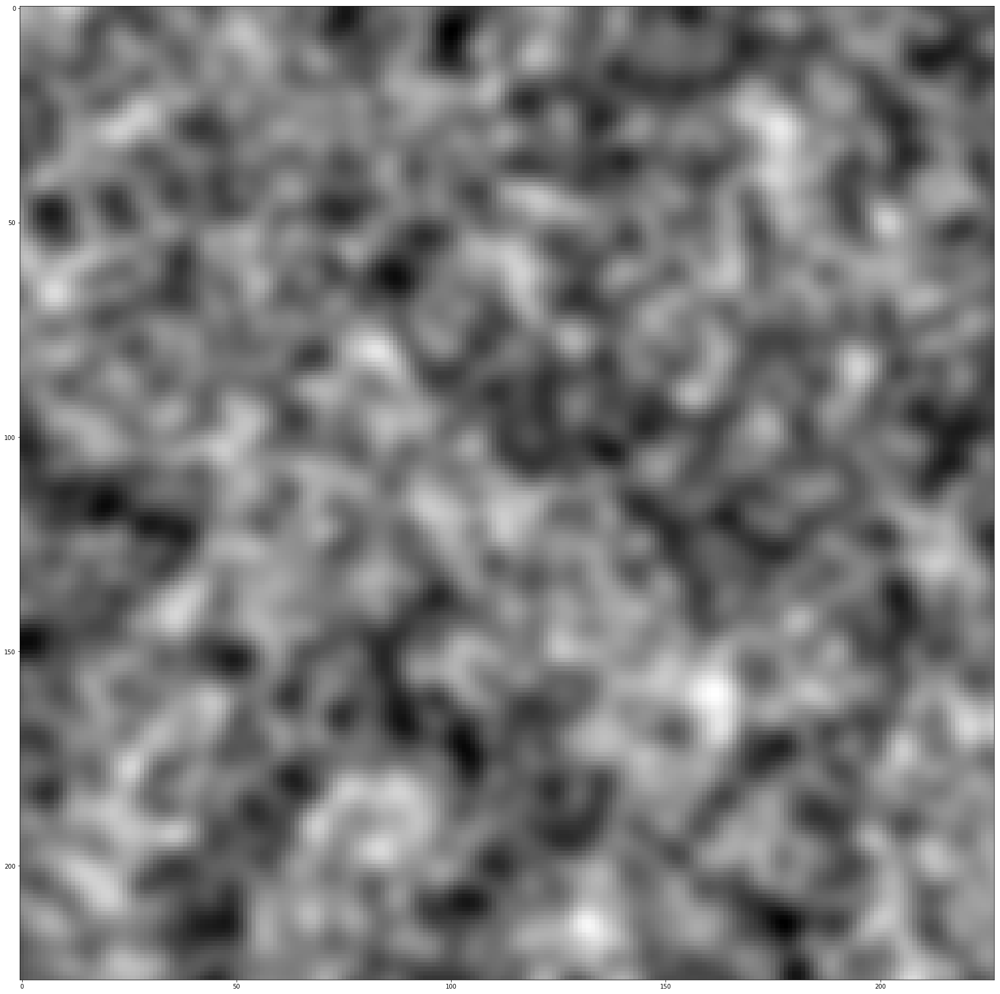

In [19]:
plt.imshow(good_data[0], cmap = 'gray') # 显示第一张小图像
plt.show()

In [20]:
print(bad_data[0]) # 同上

[[-0.11803435 -0.192691   -0.22313532 ... -0.22031325  0.00793876
   0.22631375]
 [-0.17643957 -0.2546203  -0.2984487  ... -0.30138445 -0.08749215
   0.12442566]
 [-0.26398095 -0.3434687  -0.39857608 ... -0.35947043 -0.16890173
   0.02681485]
 ...
 [-0.25290695 -0.4672042  -0.63600767 ...  0.24910939  0.31084588
   0.31721395]
 [-0.2816638  -0.49522164 -0.6716889  ...  0.17916116  0.26239064
   0.28870064]
 [-0.302837   -0.51128715 -0.69229084 ...  0.15621847  0.25575435
   0.29771355]]


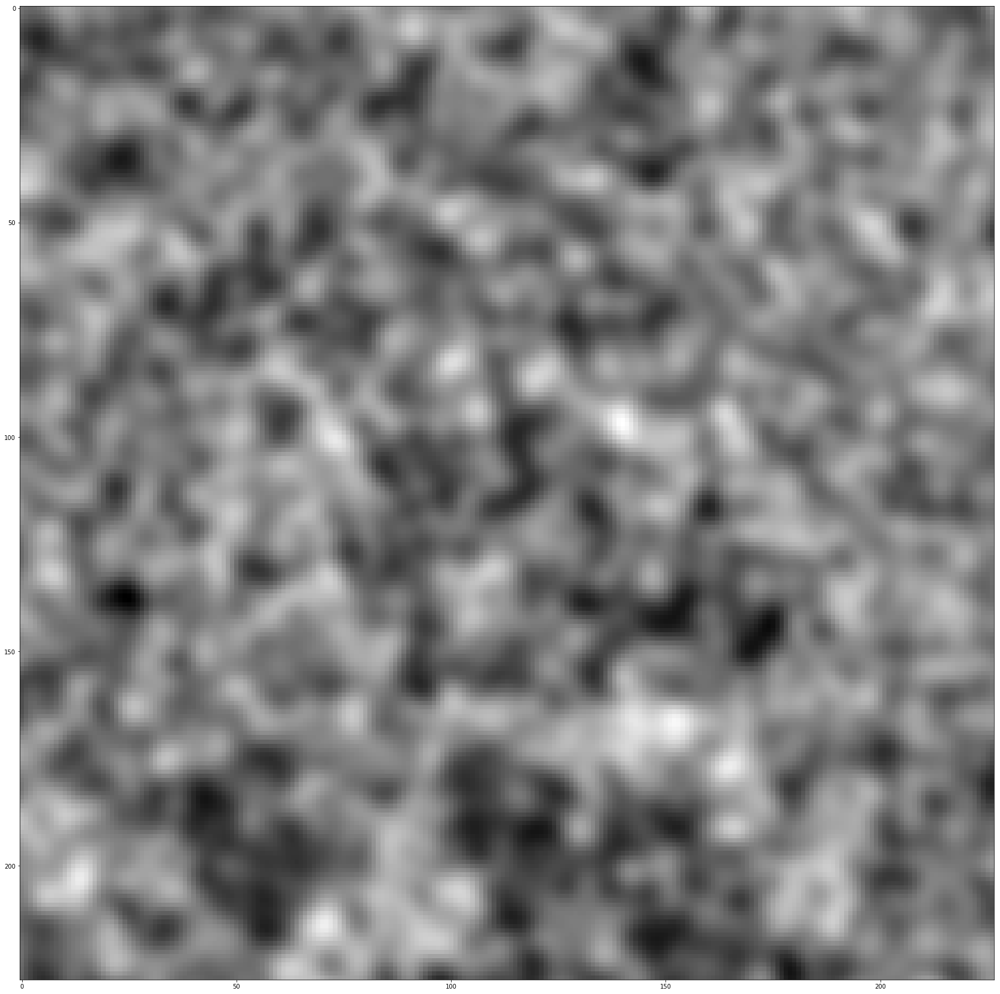

In [21]:
plt.imshow(bad_data[0], cmap = 'gray') # 同上
plt.show()

In [22]:
good_data_y = [1]*len(good_data) # 为所有图像数据设置相应的标签，对应good的图像设置为1，对应bad的图像设置为0。
print(len(good_data_y))
print(good_data_y[0:10])

9106
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1]


In [23]:
bad_data_y = [0]*len(bad_data) # 同理
print(len(bad_data_y))
print(bad_data_y[0:10])

4990
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


In [24]:
"""创建用于区分测试数据和训练数据的函数，这里本应该尽可能将数据打乱再分，由于时间关系，处理的比较简单，只是单纯的将数据根据之前的位置分成了

两部分，这里设置的4/5的数据用于训练，1/5的数据用于测试"""


def generate_train_test(good_data, good_data_y, bad_data, bad_data_y, num):
    good_for_test = len(good_data) // num 
    bad_for_test = len(bad_data) // num
    print(good_for_test, bad_for_test)
    good_data_test = good_data[:good_for_test]
    good_data_test_y = good_data_y[:good_for_test]
    good_data_train = good_data[good_for_test:]
    good_data_train_y = good_data_y[good_for_test:]
    
    bad_data_test = bad_data[:bad_for_test]
    bad_data_test_y = bad_data_y[:bad_for_test]
    bad_data_train = bad_data[bad_for_test:]
    bad_data_train_y = bad_data_y[bad_for_test:]
    
    train_data = good_data_train + bad_data_train
    train_data_y = good_data_train_y + bad_data_train_y
    test_data = good_data_test + bad_data_test
    test_data_y = good_data_test_y + bad_data_test_y
    return train_data, train_data_y, test_data, test_data_y
    
x_train, y_train, x_test, y_test= generate_train_test(good_data, good_data_y, bad_data, bad_data_y, 5)  

1821 998


In [25]:
print(len(x_train), len(y_train), len(x_test), len(y_test)) # 训练数据和测试数据的数目

11277 11277 2819 2819


In [26]:
print(x_train[0])

[[ 0.12822352  0.03624432 -0.12261988 ...  0.27040684  0.36906043
   0.42863882]
 [ 0.17847605  0.05568276 -0.12777822 ...  0.32044807  0.41770187
   0.47833097]
 [ 0.19186503  0.04063192 -0.16330282 ...  0.30821863  0.40652886
   0.4699062 ]
 ...
 [ 0.3699393   0.15779524 -0.0157742  ...  0.4252846   0.40649047
   0.34485188]
 [ 0.2976439   0.08716241 -0.07934102 ...  0.33932394  0.32574162
   0.2539654 ]
 [ 0.1664441  -0.02799147 -0.17454989 ...  0.24149227  0.25048319
   0.19065155]]


In [27]:
print(x_test[0])

[[ 0.86705685  0.79785144  0.7006167  ... -0.366738   -0.41014674
  -0.46227807]
 [ 0.86384034  0.7898185   0.69881016 ... -0.505232   -0.5309146
  -0.56199676]
 [ 0.8025363   0.7313205   0.6520047  ... -0.59251195 -0.59097713
  -0.5954087 ]
 ...
 [-0.4669437  -0.3729585  -0.2874148  ...  0.02266457  0.09638987
   0.13851897]
 [-0.49280277 -0.40643212 -0.32931405 ... -0.17089884 -0.08886405
  -0.01892845]
 [-0.4938869  -0.40829462 -0.3380525  ... -0.33989763 -0.25091502
  -0.15658638]]


In [28]:
# 对数据进行预处理，这里的函数可以将图像中像素值的范围设在0-1范围内

import numpy as np

def rescale_data(data_list):
    print(len(data_list))
    for i in range(len(data_list)):
        max_value, min_value = data_list[i].max(), data_list[i].min()
        data_list[i] = (data_list[i] - min_value)/(max_value - min_value)
        
    return data_list

In [29]:
x_train, x_test = np.array(x_train, np.float32), np.array(x_test, np.float32) # 对训练数据和测试数据都做相应处理
x_train = rescale_data(x_train)
x_test = rescale_data(x_test)

11277
2819


In [30]:
print(x_train[0]) # 这里可以看到所有数值都处于0-1之间了

[[0.48229596 0.45760363 0.41495568 ... 0.52046585 0.5469499  0.56294405]
 [0.49578655 0.462822   0.4135709  ... 0.53389966 0.560008   0.5762842 ]
 [0.4993809  0.4587815  0.40403414 ... 0.53061664 0.55700856 0.57402253]
 ...
 [0.54718584 0.49023464 0.44363898 ... 0.5620436  0.55699825 0.540451  ]
 [0.5277778  0.47127286 0.4265741  ... 0.538967   0.53532076 0.51605207]
 [0.49255648 0.4403592  0.40101478 ... 0.5127036  0.5151172  0.4990551 ]]


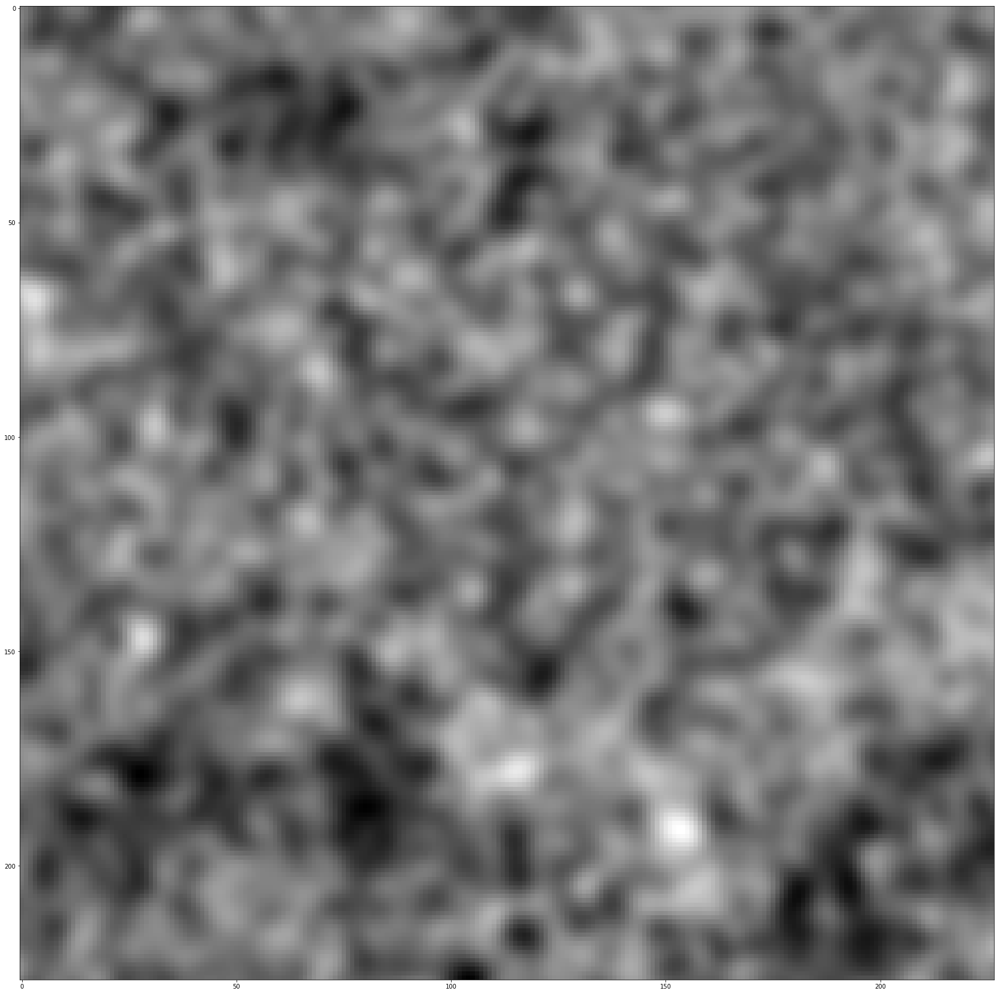

In [31]:
plt.imshow(x_train[0], cmap='gray') # 显示一张图像
plt.show()

In [32]:
print(x_test[0]) # 同上

[[0.70662737 0.68791455 0.6616228  ... 0.37301576 0.36127827 0.3471822 ]
 [0.7057576  0.6857425  0.66113436 ... 0.3355677  0.32862324 0.32021877]
 [0.6891814  0.669925   0.64847845 ... 0.31196764 0.31238267 0.3111844 ]
 ...
 [0.34592062 0.37133375 0.3944643  ... 0.47830814 0.49824306 0.50963455]
 [0.3389285  0.36228266 0.38313496 ... 0.42596963 0.44815138 0.4670616 ]
 [0.33863536 0.36177906 0.38077214 ... 0.38027322 0.40433365 0.4298396 ]]


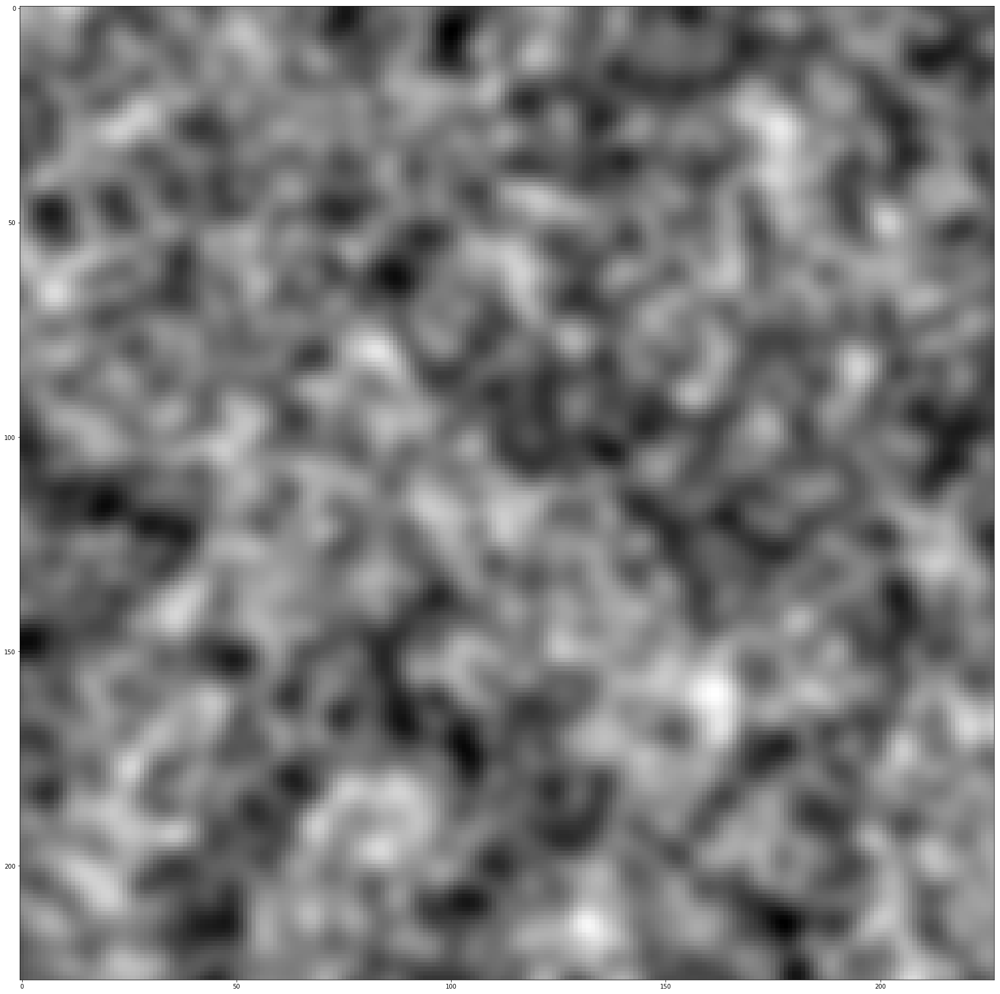

In [33]:
plt.imshow(x_test[0], cmap='gray')
plt.show()

In [34]:
y_train, y_test = np.array(y_train, np.float32), np.array(y_test, np.float32)

In [35]:
print(y_train[0], y_train[-1])

1.0 0.0


In [36]:
print(y_test[0], y_test[-1])

1.0 0.0


In [37]:
# 搭建CNN模型


import tensorflow as tf  # import related libraries
from tensorflow import keras
from tensorflow.keras import Sequential,layers, losses, optimizers

In [38]:
tf.__version__

'2.0.0'

In [39]:
"""这里的模型参考了DeepCryoPicker，不过相应做了大幅简化，去掉了许多卷积层，并大幅减少了kernel的数目，全连接层中的神经元数目也大幅减少了。

输入数据为227x227x1的图像，第一层为卷积层，设置了4个kernel, kernel_size为11x11，步长为4，第二层发为MaxPooling, size为3x3，步长为2, 
接下来是ReLU激活函数，第三层为卷积层，8个kernel, kernel_size为5x5，用‘same’padding, 步长为1，第四层为Maxplloing，siz为3x3, 步长为2,
同样接下来是ReLU激活函数，第五层和第六层都是卷积层，kernel_size均为3x3, 分别有8个和4个，步长分别为1和2，接下来将其展平用于之后的全连接层
这里设置了三个全连接层，前两个神经元数目分别设置为256和128，激活函数用ReLU，最后一个是输出层，因为是二分类问题，所以激活函数用了Sigmoid
"""


network = Sequential([        # build model
    layers.Conv2D(4, kernel_size=11, strides=4),
    layers.MaxPooling2D(pool_size=3, strides=2),
    layers.ReLU(),
    layers.Conv2D(8, kernel_size=5, padding = 'same', strides=1),
    layers.MaxPooling2D(pool_size=3, strides=2),
    layers.ReLU(),
    layers.Conv2D(8, kernel_size=3, padding = 'same', strides=1),
    layers.ReLU(),
    layers.Conv2D(4, kernel_size=3, strides=2),
    layers.ReLU(),
    layers.Flatten(),
    
    layers.Dense(256, activation='relu'),
    layers.Dense(128, activation='relu'),
    layers.Dense(1, activation='sigmoid')
])

network.build(input_shape=(4, 227, 227, 1))

In [40]:
network.summary() # dispaly the general information

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              multiple                  488       
_________________________________________________________________
max_pooling2d (MaxPooling2D) multiple                  0         
_________________________________________________________________
re_lu (ReLU)                 multiple                  0         
_________________________________________________________________
conv2d_1 (Conv2D)            multiple                  808       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 multiple                  0         
_________________________________________________________________
re_lu_1 (ReLU)               multiple                  0         
_________________________________________________________________
conv2d_2 (Conv2D)            multiple                  5

In [41]:
batch_size = 20 # 设置batch_size

In [42]:
train_data = tf.data.Dataset.from_tensor_slices((x_train, y_train)) # slice the dataset
train_data = train_data.repeat().shuffle(1000).batch(batch_size).prefetch(1) # 打乱数据

In [43]:
from tensorflow.keras import losses, optimizers

criteon = losses.binary_crossentropy # 使用binary_crossentropy损失函数，可以用类似格式调用其他损失函数

In [44]:
learning_rate = 0.001
optimizer = tf.optimizers.Adam(learning_rate) # 使用'Adam' optimizer，同样也可以用类似方式调用其他optimizer

In [45]:
def run_optimization(x, y):  # 定于用于前向传播和参数更新的函数
    with tf.GradientTape() as tape:
        x = tf.expand_dims(x, axis=3) # 修改数据维度，否则会报错
        out = network(x) # 前向传播
        y_onehot = tf.one_hot(y, depth=2)
        loss = criteon(y_onehot, out)
    grads = tape.gradient(loss, network.trainable_variables) # 更新所有参数
    optimizer.apply_gradients(zip(grads, network.trainable_variables)) 

In [46]:
def accuracy(y_pred, y_true):  # 定义accuracy函数
    correct_prediction = tf.equal(tf.argmax(y_pred, 1), tf.cast(y_true, tf.int64))
    return tf.reduce_mean(tf.cast(correct_prediction, tf.float32), axis=-1)

In [ ]:
# learning_rate = 0.001
epochs = 200 # 设置200次迭代
display_step = 10 # 每10次迭代显示结果

In [ ]:
# 开始训练，非常奇怪的是运行到这一步kernel都会挂掉，不清楚什么原因导致的

for step, (batch_x, batch_y) in enumerate(train_data.take(epochs), 1):  # stat trainging 
    run_optimization(batch_x, batch_y)
    
    if step % display_step == 0:
        batch_x = tf.expand_dims(batch_x,axis=3)
        pred = network(batch_x)
        y_onehot = tf.one_hot(batch_y, depth=2)
        loss = criteon(y_onehot, pred)
        acc = accuracy(pred, batch_y)
        print("epoch: %i, loss: %f, accuracy: %f" % (step, loss, acc))

In [ ]:
x_test = tf.expand_dims(x_test, axis=3)  # 用于训练集测试,不过前面开始出问题了，这一步没有继续跑下去
pred = network(x_test)
print("Test Accuracy: %f" % accuracy(pred, test_data))